# Network Analysis: Semiconductor supply chain
# Author: Julián Andrés Salazar
# Method: HITS Algorithm 

## Part 1: 
On the first part, I focus on crearing the weighted adjacency matrix to reveal the level of centrality and/or importance of a node in the World Trade Network. 

I initially do this focusing only on year 2022. 

In [ ]:
import networkx as nx
import pandas as pd 
import plotly.graph_objects as go
import plotly.express as px
import plotly.io as pio
import numpy as np

from plotly.subplots import make_subplots

In [ ]:
BACI_2022 = pd.read_csv("BACI_HS92_Y2022_V202401b.csv")
country_codes=pd.read_csv("country_codes_V202401b.csv")
BACI_2022 = pd.merge(BACI_2022, country_codes, left_on="i", right_on="country_code", how="left")
BACI_2022 = pd.merge(BACI_2022, country_codes, left_on="j", right_on="country_code", how="left")

In [ ]:
semiconductor_codes = [
    848610, 848620, 848640, 851419, 851981, 852351, 852352, 852359,
    854141, 854142, 854143, 854149, 854151, 854159, 854190, 903082, 903141
]

BACI_2022 = BACI_2022[BACI_2022["k"].isin(semiconductor_codes)]


BACI_2022 = BACI_2022[["country_iso3_x", "country_iso3_y", "k", "v"]]
BACI_2022 = BACI_2022.rename(columns={"country_iso3_x": "exporter", "country_iso3_y": "importer", "k":"product_code","v":"export_value"})

In [ ]:
G=nx.DiGraph()
country_set=set(BACI_2022["exporter"].values.tolist()+BACI_2022["importer"].values.tolist())
G.add_nodes_from(country_set)

In [ ]:
# Initialize the list of exporters and importers
exporters = set(BACI_2022['exporter'].unique())
importers = set(BACI_2022['importer'].unique())

# Ensure that both lists have the same length
max_length = max(len(exporters), len(importers))
exporters = list(exporters)[:max_length]
importers = list(importers)[:max_length]

# Add missing importers with export_value of 0
missing_importers = set(exporters).difference(importers)
missing_importers_data = [{'exporter': importer, 'importer': importer, 'export_value': 0} for importer in missing_importers]
missing_importers_df = pd.DataFrame(missing_importers_data)
BACI_2022 = pd.concat([BACI_2022, missing_importers_df], ignore_index=True)

# Add missing exporters with export_value of 0
missing_exporters = set(importers).difference(exporters)
missing_exporters_data = [{'exporter': exporter, 'importer': exporter, 'export_value': 0} for exporter in missing_exporters]
missing_exporters_df = pd.DataFrame(missing_exporters_data)
BACI_2022 = pd.concat([BACI_2022, missing_exporters_df], ignore_index=True)

# Add edges to the graph
for _, row in BACI_2022.iterrows():
    exporter = row['exporter']
    importer = row['importer']
    export_value = row['export_value']

    G.add_edge(exporter, importer, weight=export_value)


In [ ]:
#Adjacency Matrix

# Initialize dictionaries to store total import and export values for each node
import_values = {}
export_values = {}

# Iterate through edges and accumulate import and export values for each node
for exporter, importer, data in G.edges(data=True):
    export_value = data['weight']
    export_values[exporter] = export_values.get(exporter, 0) + export_value
    import_values[importer] = import_values.get(importer, 0) + export_value

# Get unique exporters and importers
exporters = BACI_2022['exporter'].unique()
importers = BACI_2022['importer'].unique()

# Sort the arrays 'exporters' and 'importers' alphabetically
exporters.sort()
importers.sort()

# Create an empty adjacency matrix
adj_matrix = np.zeros((len(exporters), len(importers)), dtype=float)
adj_matrix = pd.DataFrame(adj_matrix, index=exporters, columns=importers)

# Now, calculate the weighted adjacency matrix based on the data in 'adjacency_data'
aggregated_data = BACI_2022.groupby(['exporter', 'importer'])['export_value'].sum().reset_index()
for i, row in aggregated_data.iterrows():
    exporter_idx = np.where(exporters == row['exporter'])[0][0]
    importer_idx = np.where(importers == row['importer'])[0][0]
    adj_matrix.iloc[exporter_idx, importer_idx] = row['export_value']

# Convert float values to integers
adj_matrix = adj_matrix.astype(int)

# Calculate out-strength and in-strength for 2022
out_strength_2022 = adj_matrix.sum(axis=1)
in_strength_2022 = adj_matrix.sum(axis=0)

In [ ]:
adj_matrix

In [ ]:
# Step 1: Define initial values for authority vector (x) and hub vector (y)
N = len(G.nodes())
x = np.ones(N) / N  # Initial authority vector
y = np.ones(N) / N  # Initial hub vector

# Step 2: Define initial normalization factors
c = 1
d = 1

# Step 3: Iterate until convergence
max_iterations = 1000  # You can adjust this as needed
tolerance = 1e-6  # You can adjust this as needed
for _ in range(max_iterations):
    x_old = x.copy()
    y_old = y.copy()

    # Step 4: Update x(t+1) and y(t+1)
    x = c * np.dot(adj_matrix.T, y)
    y = d * np.dot(adj_matrix, x)

    # Step 5: Normalize x and y
    x_sum = np.sum(x)
    y_sum = np.sum(y)
    x /= x_sum
    y /= y_sum

# Create dictionaries mapping node indices to country names
node_index_to_country = {index: country for index, country in enumerate(adj_matrix.index)}

# Create lists of country names corresponding to the authority and hub vectors
authority_countries = [node_index_to_country[i] for i in range(len(x))]
hub_countries = [node_index_to_country[i] for i in range(len(y))]

# Convert authority and hub to DataFrames
authority_df = pd.DataFrame({'authority_score': x, 'country': authority_countries})
hub_df = pd.DataFrame({'hub_score': y, 'country': hub_countries})

# Calculate total exports and imports for each country
exports_2022 = pd.DataFrame(adj_matrix.sum(axis=1), columns=['exports'])
imports_2022 = pd.DataFrame(adj_matrix.sum(axis=0), columns=['imports'])

# Merge total exports and imports with authority and hub DataFrames
authority_df = pd.merge(authority_df, imports_2022, left_on='country', right_index=True)
hub_df = pd.merge(hub_df, exports_2022, left_on='country', right_index=True)

# Add authority and hub ranks
authority_df['authority_rank'] = authority_df['authority_score'].rank(ascending=False, na_option='bottom').astype(int)
hub_df['hub_rank'] = hub_df['hub_score'].rank(ascending=False, na_option='bottom').astype(int)

# Sort authority and hub DataFrames by score (descending)
authority_df = authority_df.sort_values(by='authority_score', ascending=False)
hub_df = hub_df.sort_values(by='hub_score', ascending=False)

# Reset index for both DataFrames
authority_df = authority_df.reset_index(drop=True)
hub_df = hub_df.reset_index(drop=True)

worldtrade_2022 = pd.merge(authority_df, hub_df, on='country', suffixes=('_authority', '_hub'))
# Rename the column
worldtrade_2022.rename(columns={'country': 'country_iso3'}, inplace=True)
worldtrade_2022.head(5)

In [ ]:
# Create dictionaries for each attribute
authority_score = dict(zip(worldtrade_2022['country_iso3'], worldtrade_2022['authority_score']))
authority_rank = dict(zip(worldtrade_2022['country_iso3'], worldtrade_2022['authority_rank']))
hub_score = dict(zip(worldtrade_2022['country_iso3'], worldtrade_2022['hub_score']))
hub_rank = dict(zip(worldtrade_2022['country_iso3'], worldtrade_2022['hub_rank']))

# Set node attributes for each attribute
nx.set_node_attributes(G, authority_score, name='authority_score')
nx.set_node_attributes(G, authority_rank, name='authority_rank')
nx.set_node_attributes(G, hub_score, name='hub_score')
nx.set_node_attributes(G, hub_rank, name='hub_rank')

# Add additional node attributes
country_names = dict(zip(country_codes['country_iso3'], country_codes['country_name']))
nx.set_node_attributes(G, country_names, name='name')

country_iso2 = dict(zip(country_codes['country_iso3'], country_codes['country_iso2']))
nx.set_node_attributes(G, country_iso2, name='country_iso2')


In [ ]:
pagerank_scores=nx.pagerank(G)
degree_centralities=nx.degree_centrality(G)
betweenness_centrality=nx.betweenness_centrality(G)
eigenvector_centrality=nx.eigenvector_centrality(G)
#sorted(degree_centralities.items(), key=lambda x: x[1], reverse=True)

adjacencies = {k: len(v) for k, v in dict(G.adjacency()).items()}

#sorted(adjacencies.items(), key=lambda x: x[1], reverse=True)

#Import and Export connections

import_adjacencies = {node: G.in_degree(node) for node in G.nodes}
export_adjacencies = {node: G.out_degree(node) for node in G.nodes}
total_connections = {node: G.degree(node) for node in G.nodes}
number_partners = {node: len(set(G.successors(node)) | set(G.predecessors(node))) for node in G.nodes}


#sorted(import_adjacencies.items(), key=lambda x: x[1], reverse=True)

In [ ]:
nx.set_node_attributes(G, pagerank_scores, 'PageRank')
nx.set_node_attributes(G, number_partners, 'number_partners')
nx.set_node_attributes(G, total_connections, 'total_connections')
nx.set_node_attributes(G, adjacencies, 'adjacency')
nx.set_node_attributes(G, import_adjacencies, 'import_adjacency')
nx.set_node_attributes(G, export_adjacencies, 'export_adjacency')
nx.set_node_attributes(G, in_strength_2022, 'import_values')
nx.set_node_attributes(G, out_strength_2022, 'export_values')
nx.set_node_attributes(G, country_names, name='name')
nx.set_node_attributes(G, degree_centralities, name='degree_centralities')
nx.set_node_attributes(G, betweenness_centrality, name='betweenness_centrality')
nx.set_node_attributes(G, eigenvector_centrality, name='eigenvector_centrality')

In [ ]:
G.nodes['FIN']

In [ ]:
df_node_attributes = pd.DataFrame([{'country': node, **G.nodes[node]} for node in G.nodes()])
df_node_attributes = df_node_attributes \
                      .sort_values(by=['PageRank'], ascending=True)
df_node_attributes["Exports+Imports"] = df_node_attributes["export_values"] + df_node_attributes["import_values"]
df_node_attributes["authority_score"] = df_node_attributes["authority_score"]*100
df_node_attributes["hub_score"] = df_node_attributes["hub_score"]*100

In [ ]:
# Get the x, y of each node using spring_layout
layout = nx.spring_layout(G, k=0.99, iterations=9)

In [ ]:
layout["USA"]

In [ ]:
# Create empty lists to store coordinates
x_coordinates = []
y_coordinates = []

# Loop through each node in df_node_attributes
for node in df_node_attributes['country']:
    # Retrieve x and y coordinates from layout
    x, y = layout[node]
    
    # Append coordinates to the lists
    x_coordinates.append(x)
    y_coordinates.append(y)

# Add coordinates to the DataFrame
df_node_attributes['x_coordinate'] = x_coordinates
df_node_attributes['y_coordinate'] = y_coordinates

In [ ]:
#Edges of network

edge_x = []
edge_y = []

for exporter, importer in G.edges():
    x0, y0 = layout[exporter]
    x1, y1 = layout[importer]

    edge_x.append(x0)
    edge_x.append(x1)
    edge_x.append(None)
    edge_y.append(y0)
    edge_y.append(y1)
    edge_y.append(None)

edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.1, color='#888'),
    hoverinfo='none',
    mode='lines')

In [ ]:
#Nodes of network

node_x = []
node_y = []
node_text = []

for node in df_node_attributes['country']:
    x, y = layout[node]
    text = node
    node_x.append(x)
    node_y.append(y)
    node_text.append(text)

node_trace = go.Scatter(
    x=node_x, 
    y=node_y,
    text=node_text,
    mode='markers+text',
    hoverinfo='text',
    textfont=dict(
        size=10
    ))

In [ ]:
node_text = []
node_adjacencies = []
node_hovertext = []


for country in df_node_attributes['country']:
    node_text.append(country)


    country_name= df_node_attributes[df_node_attributes['country'] == country]['name'].values[0]
    PageRank = df_node_attributes[df_node_attributes['country'] == country]['PageRank'].values[0]
    node_degree_centralities = df_node_attributes[df_node_attributes['country'] == country]['degree_centralities'].values[0]
    betweenness_centrality = df_node_attributes[df_node_attributes['country'] == country]['betweenness_centrality'].values[0]
    eigenvector_centrality = df_node_attributes[df_node_attributes['country'] == country]['eigenvector_centrality'].values[0]
    connections = df_node_attributes[df_node_attributes['country'] == country]['adjacency'].values[0]
    number_partners=df_node_attributes[df_node_attributes['country'] == country]['number_partners'].values[0]
    total_connections=df_node_attributes[df_node_attributes['country'] == country]['total_connections'].values[0]
    import_connections= df_node_attributes[df_node_attributes['country'] == country]['import_adjacency'].values[0]
    export_connections= df_node_attributes[df_node_attributes['country'] == country]['export_adjacency'].values[0]
    import_weights=df_node_attributes[df_node_attributes['country'] == country]['import_values'].values[0]
    export_weights=df_node_attributes[df_node_attributes['country'] == country]['export_values'].values[0]  
    authority_score=df_node_attributes[df_node_attributes['country'] == country]['authority_score'].values[0]
    authority_rank=df_node_attributes[df_node_attributes['country'] == country]['authority_rank'].values[0]
    hub_score=df_node_attributes[df_node_attributes['country'] == country]['hub_score'].values[0]
    hub_rank=df_node_attributes[df_node_attributes['country'] == country]['hub_rank'].values[0]

    hovertext = f'[<b>{country_name}</b>]<br>&#x2022;<b>HITS Ranking:</b><br>As an importer: {authority_rank}<br>As an exporter: {hub_rank}<br>&#x2022;<b>HITS Score:</b><br>As an importer: {authority_score: .4f}<br>As an exporter: {hub_score: .4f}<br>&#x2022;<b>Centrality Indicators:</b><br>Centrality Degree: {node_degree_centralities: .4f}<br>Betweenness Degree: {betweenness_centrality: .4f}<br>Eigenvector Centrality: {eigenvector_centrality: .4f}<br>PageRank Score: {PageRank: .4f}<br>&#x2022;<b>Connection Indicators:</b><br># of partners: {number_partners}<br># of connections: {total_connections}<br># of import connections: {import_connections}<br># of export connections: {export_connections}<br>&#x2022;<b>Trade Balance (USD Thousands):</b><br>Sum of Imports: $ {import_weights:.2f}<br>Sum of Exports: $ {export_weights:.2f}'
    node_adjacencies.append(node_degree_centralities)
    node_hovertext.append(hovertext) 

node_trace.text=node_text
node_trace.marker.color = node_adjacencies
node_trace.hovertext = node_hovertext

In [ ]:
fig = go.Figure(layout=go.Layout(
    title="<b>World Trade Network</b><br><i>Supply chain of semiconductors (Year 2022)</i>",
    titlefont=dict(size=18),
    title_x=0.5,
    font=dict(family="Merriweather, FontAwesome", color="white"),
    paper_bgcolor='black',  # Corrected background color attribute
    plot_bgcolor='black',
    showlegend=False,
    hovermode='closest',
    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)
))


fig.add_annotation(
    x=0.5,
    y=-0.2,
    xref='paper',
    yref='paper',
    text=(
        "&#xf099; juliansalazarz1 <br>"
        "&#xf0e1; Julián Andrés Salazar <br> "
        "&#xf200; TidyTuesday<br>"
        "\uf02d Source:<a href='http://www.cepii.fr/CEPII/en/bdd_modele/bdd_modele_item.asp?id=37'>BACI</a>"
    ),
    showarrow=False,
    font=dict(color="white", family="Source Sans Pro, FontAwesome")
)

fig.add_trace(edge_trace)
fig.add_trace(node_trace)


fig.update_traces(marker_color="rgba(0,0,0,0)", textfont=dict(color="rgba(0,0,0,0)"))

minDim = df_node_attributes[["export_values", "import_values"]].max().idxmax()
maxi = df_node_attributes[minDim].max()

for i, row in df_node_attributes.iterrows():
    country_iso = row["country_iso2"]
    fig.add_layout_image(
        dict(
            source=f"https://raw.githubusercontent.com/matahombres/CSS-Country-Flags-Rounded/master/flags/{country_iso}.png",
            xref="x",
            yref="y",
            xanchor="center",
            yanchor="middle",
            x=row["x_coordinate"],
            y=row["y_coordinate"],
            sizex=0.095,
            sizey=0.095,
            sizing="contain",
            opacity=0.8,
            layer="above"
        )
     )


fig.show()

In [ ]:
fig.write_html("trade_network.html")

In [ ]:
df_node_attributes.head()

In [ ]:
fig = px.scatter(
    df_node_attributes,
    x="hub_score",
    y="authority_score",
    hover_name="name",
    custom_data=[
        "authority_rank", "hub_rank", "authority_score", "hub_score",
        "degree_centralities", "betweenness_centrality", "eigenvector_centrality",
        "PageRank", "number_partners", "total_connections", "import_adjacency", 
        "export_adjacency", "import_values", "export_values"
    ]
)

# Update traces to customize the hover text
fig.update_traces(
    marker_color="rgba(0,0,0,0)",
    hovertemplate=(
        '<b>%{hovertext}</b><br>'
        '&#x2022;<b>HITS Ranking:</b><br>'
        'As an importer: %{customdata[0]}<br>'
        'As an exporter: %{customdata[1]}<br>'
        '&#x2022;<b>HITS Score:</b><br>'
        'As an importer: %{customdata[2]:.4f}<br>'
        'As an exporter: %{customdata[3]:.4f}<br>'
        '&#x2022;<b>Centrality Indicators:</b><br>'
        'Centrality Degree: %{customdata[4]:.4f}<br>'
        'Betweenness Degree: %{customdata[5]:.4f}<br>'
        'Eigenvector Centrality: %{customdata[6]:.4f}<br>'
        'PageRank Score: %{customdata[7]:.4f}<br>'
        '&#x2022;<b>Connection Indicators:</b><br>'
        '# of partners: %{customdata[8]}<br>'
        '# of connections: %{customdata[9]}<br>'
        '# of import connections: %{customdata[10]}<br>'
        '# of export connections: %{customdata[11]}<br>'
        '&#x2022;<b>Trade Balance (USD Thousands):</b><br>'
        'Sum of Imports: $ %{customdata[12]:.2f}<br>'
        'Sum of Exports: $ %{customdata[13]:.2f}'
    )
)

minDim = df_node_attributes[["hub_score", "authority_score"]].max().idxmax()
maxi = df_node_attributes[minDim].max()
for i, row in df_node_attributes.iterrows():
    country_iso = row["country_iso2"]
    fig.add_layout_image(
        dict(
            source=f"https://raw.githubusercontent.com/matahombres/CSS-Country-Flags-Rounded/master/flags/{country_iso}.png",
            xref="x",
            yref="y",
            xanchor="center",
            yanchor="middle",
            x=row["hub_score"],
            y=row["authority_score"],
            sizex=np.sqrt(row["Exports+Imports"] / df_node_attributes["Exports+Imports"].max()) * maxi * 0.15 + maxi * 0.03,
            sizey=np.sqrt(row["Exports+Imports"] / df_node_attributes["Exports+Imports"].max()) * maxi * 0.15 + maxi * 0.03,
            sizing="contain",
            opacity=0.8,
            layer="above"
        )
    )

fig.update_layout(
    title="<b>World Trade Integration</b><br><i>HITS Algorithm: Supply chain of semiconductors (Year 2022)</i>",
    title_x=0.5,
    title_font_family="Merriweather",
    font_family="Source Sans Pro, FontAwesome",
    title_font_size=18,
    template="plotly_dark",
    xaxis_title="Hub Score",  
    yaxis_title="Authority Score"  
)

fig.add_annotation(
    x=1,
    y=-0.2,
    xref='paper',
    yref='paper',
    text=' &#xf099; juliansalazarz1 <br> &#xf0e1; Julián Andrés Salazar<br> &#xf200; TidyTuesday<br>\uf02d Source:<a href="http://www.cepii.fr/CEPII/en/bdd_modele/bdd_modele_item.asp?id=37"> BACI</a>',
    showarrow=False,
    font=dict(color="white") 
)

fig.show()


In [ ]:
fig.write_html("trade_network_scatterplot.html")

In [ ]:
%reset

## Part 2:

On this part, I try to create a three-dimensional weighted adjacency matrix, to analyze the evolution of the integration of a country in the world trade network. 

In [2]:
import networkx as nx
import pandas as pd 
import plotly.graph_objects as go
import plotly.express as px
import plotly.io as pio
import numpy as np

from plotly.subplots import make_subplots

In [ ]:
# Load the country codes file once
country_codes = pd.read_csv("country_codes_V202401b.csv")

# List of semiconductor codes
semiconductor_codes = [
    848610, 848620, 848640, 851419, 851981, 852351, 852352, 852359,
    854141, 854142, 854143, 854149, 854151, 854159, 854190, 903082, 903141
]

# Initialize an empty DataFrame to hold the combined data
BACI_1995_2022 = pd.DataFrame()

# Collect all unique countries over the entire period
all_exporters_importers = set()

# Loop over the years from 1995 to 2022 to collect all unique country codes
for year in range(1995, 2022 + 1):
    # Construct the file name
    file_name = f"BACI_HS92_Y{year}_V202401b.csv"
    
    # Read the data for the current year
    BACI_year = pd.read_csv(file_name)
    
    # Merge with country codes to get exporter and importer names
    BACI_year = pd.merge(BACI_year, country_codes, left_on="i", right_on="country_code", how="left")
    BACI_year = pd.merge(BACI_year, country_codes, left_on="j", right_on="country_code", how="left")
    
    # Collect all unique exporters and importers
    all_exporters_importers.update(BACI_year["country_iso3_x"].unique())
    all_exporters_importers.update(BACI_year["country_iso3_y"].unique())

# Convert set to list for later use
all_exporters_importers = list(all_exporters_importers)

# Loop over the years again to process and align the data
for year in range(1995, 2022 + 1):
    # Construct the file name
    file_name = f"BACI_HS92_Y{year}_V202401b.csv"
    
    # Read the data for the current year
    BACI_year = pd.read_csv(file_name)
    
    # Merge with country codes to get exporter and importer names
    BACI_year = pd.merge(BACI_year, country_codes, left_on="i", right_on="country_code", how="left")
    BACI_year = pd.merge(BACI_year, country_codes, left_on="j", right_on="country_code", how="left")
    
    # Filter for semiconductor codes
    BACI_year = BACI_year[BACI_year["k"].isin(semiconductor_codes)]
    
    # Select relevant columns and rename them
    BACI_year = BACI_year[["country_iso3_x", "country_iso3_y", "k", "v"]]
    BACI_year = BACI_year.rename(columns={"country_iso3_x": "exporter", "country_iso3_y": "importer", "k": "product_code", "v": "export_value"})
    
    # Create a DataFrame with all possible exporter-importer pairs for the current year
    complete_pairs = pd.DataFrame([(exp, imp) for exp in all_exporters_importers for imp in all_exporters_importers], columns=["exporter", "importer"])
    
    # Merge with the current year's data to include all pairs, filling missing export values with 0
    BACI_year = pd.merge(complete_pairs, BACI_year, on=["exporter", "importer"], how="left")
    BACI_year["export_value"] = BACI_year["export_value"].fillna(0)
    
    # Add a column for the year
    BACI_year["year"] = year
    
    # Append the data for the current year to the combined DataFrame
    BACI_1995_2022 = pd.concat([BACI_1995_2022, BACI_year], ignore_index=True)

# Save the combined data to a new CSV file if needed
BACI_1995_2022.to_csv("BACI_combined_1995_2022.csv", index=False)

# Display the first few rows of the combined data to verify
BACI_1995_2022.head(10)

In [3]:
country_codes = pd.read_csv("country_codes_V202401b.csv")
BACI_1995_2022=pd.read_csv("BACI_combined_1995_2022.csv")
BACI_1995_2022.head(10)

,exporter,importer,product_code,export_value,year
0,NER,NER,NaN,0.0,1995
1,NER,NRU,NaN,0.0,1995
2,NER,FIN,NaN,0.0,1995
3,NER,LUX,NaN,0.0,1995
4,NER,MAR,NaN,0.0,1995
5,NER,ANT,NaN,0.0,1995
6,NER,GRC,NaN,0.0,1995
7,NER,CAF,NaN,0.0,1995
8,NER,AUS,NaN,0.0,1995
9,NER,HUN,NaN,0.0,1995


In [4]:
all_years_data = []

for year in range(1995, 2022 + 1):
    BACI_year = BACI_1995_2022[BACI_1995_2022["year"] == year]

    # Create a directed graph
    Gyear = nx.DiGraph()

    # Add nodes
    country_set = set(BACI_year["exporter"].values.tolist() + BACI_year["importer"].values.tolist())
    Gyear.add_nodes_from(country_set)

    # Add edges with weights
    for _, row in BACI_year.iterrows():
        exporter = row['exporter']
        importer = row['importer']
        export_value = row['export_value']
        Gyear.add_edge(exporter, importer, weight=export_value)

    # Adjacency Matrix
    exporters = BACI_year['exporter'].unique()
    importers = BACI_year['importer'].unique()

    # Sort the arrays 'exporters' and 'importers' alphabetically
    exporters.sort()
    importers.sort()

    # Create an empty adjacency matrix
    adj_matrixyear = np.zeros((len(exporters), len(importers)), dtype=float)
    adj_matrixyear = pd.DataFrame(adj_matrixyear, index=exporters, columns=importers)

    # Calculate the weighted adjacency matrix based on the data
    aggregated_data = BACI_year.groupby(['exporter', 'importer'])['export_value'].sum().reset_index()
    for _, row in aggregated_data.iterrows():
        adj_matrixyear.loc[row['exporter'], row['importer']] = row['export_value']

    # Convert float values to integers
    adj_matrixyear = adj_matrixyear.astype(int)

    # Step 1: Define initial values for authority vector (x) and hub vector (y)
    N = len(Gyear.nodes())
    x = np.ones(N) / N  # Initial authority vector
    y = np.ones(N) / N  # Initial hub vector

    # Step 2: Define initial normalization factors
    c = 1
    d = 1

    # Step 3: Iterate until convergence
    max_iterations = 1000  # You can adjust this as needed
    tolerance = 1e-6  # You can adjust this as needed
    for _ in range(max_iterations):
        x_old = x.copy()
        y_old = y.copy()

        # Step 4: Update x(t+1) and y(t+1)
        x = c * np.dot(adj_matrixyear.T, y)
        y = d * np.dot(adj_matrixyear, x)

        # Step 5: Normalize x and y
        x_sum = np.sum(x)
        y_sum = np.sum(y)
        x /= x_sum
        y /= y_sum

    # Create dictionaries mapping node indices to country names
    node_index_to_country = {index: country for index, country in enumerate(adj_matrixyear.index)}

    # Create lists of country names corresponding to the authority and hub vectors
    authority_countries = [node_index_to_country[i] for i in range(len(x))]
    hub_countries = [node_index_to_country[i] for i in range(len(y))]

    # Convert authority and hub to DataFrames
    authority_df = pd.DataFrame({'authority_score': x, 'country': authority_countries})
    hub_df = pd.DataFrame({'hub_score': y, 'country': hub_countries})

    # Calculate total exports and imports for each country
    exports_year = pd.DataFrame(adj_matrixyear.sum(axis=1), columns=['export_values'])
    imports_year = pd.DataFrame(adj_matrixyear.sum(axis=0), columns=['import_values'])

    # Calculate import adjacencies for those values of the adjacency matrix that are higher than 0
    import_adjacenciesyear = pd.DataFrame((adj_matrixyear > 0).sum(axis=0), columns=['import_adjacencies'])

    # Calculate export adjacencies for those values of the adjacency matrix that are higher than 0
    export_adjacenciesyear = pd.DataFrame((adj_matrixyear > 0).sum(axis=1), columns=['export_adjacencies'])

    # Merge total exports and imports with authority and hub DataFrames
    authority_df = pd.merge(authority_df, imports_year, left_on='country', right_index=True)
    authority_df = pd.merge(authority_df, import_adjacenciesyear, left_on='country', right_index=True)
    hub_df = pd.merge(hub_df, exports_year, left_on='country', right_index=True)
    hub_df = pd.merge(hub_df, export_adjacenciesyear, left_on='country', right_index=True)

    # Add authority and hub ranks
    authority_df['authority_rank'] = authority_df['authority_score'].rank(ascending=False, na_option='bottom').astype(int)
    hub_df['hub_rank'] = hub_df['hub_score'].rank(ascending=False, na_option='bottom').astype(int)

    # Sort authority and hub DataFrames by score (descending)
    authority_df = authority_df.sort_values(by='authority_score', ascending=False)
    hub_df = hub_df.sort_values(by='hub_score', ascending=False)

    # Reset index for both DataFrames
    authority_df = authority_df.reset_index(drop=True)
    hub_df = hub_df.reset_index(drop=True)

    # Merge authority and hub DataFrames on 'country'
    worldtrade_year = pd.merge(authority_df, hub_df, on='country')

    # Rename the column
    worldtrade_year.rename(columns={'country': 'country_iso3'}, inplace=True)

    # Create dictionaries for each attribute
    authority_score = dict(zip(worldtrade_year['country_iso3'], worldtrade_year['authority_score']))
    authority_rank = dict(zip(worldtrade_year['country_iso3'], worldtrade_year['authority_rank']))
    hub_score = dict(zip(worldtrade_year['country_iso3'], worldtrade_year['hub_score']))
    hub_rank = dict(zip(worldtrade_year['country_iso3'], worldtrade_year['hub_rank']))
    import_adjacencies = dict(zip(worldtrade_year['country_iso3'], worldtrade_year['import_adjacencies']))
    export_adjacencies = dict(zip(worldtrade_year['country_iso3'], worldtrade_year['export_adjacencies']))
    import_values = dict(zip(worldtrade_year['country_iso3'], worldtrade_year['import_values']))
    export_values = dict(zip(worldtrade_year['country_iso3'], worldtrade_year['export_values']))

    # Set node attributes for each attribute
    nx.set_node_attributes(Gyear, authority_score, name='authority_score')
    nx.set_node_attributes(Gyear, authority_rank, name='authority_rank')
    nx.set_node_attributes(Gyear, hub_score, name='hub_score')
    nx.set_node_attributes(Gyear, hub_rank, name='hub_rank')
    nx.set_node_attributes(Gyear, import_values, name='import_values')
    nx.set_node_attributes(Gyear, export_values, name='export_values')
    nx.set_node_attributes(Gyear, import_adjacencies, name='import_adjacencies')
    nx.set_node_attributes(Gyear, export_adjacencies, name='export_adjacencies')

    # Add additional node attributes
    country_names = dict(zip(country_codes['country_iso3'], country_codes['country_name']))
    nx.set_node_attributes(Gyear, country_names, name='name')

    country_iso2 = dict(zip(country_codes['country_iso3'], country_codes['country_iso2']))
    nx.set_node_attributes(Gyear, country_iso2, name='country_iso2')

    # Convert node attributes to DataFrame for version 1
    df_node_attributesyear_version1 = pd.DataFrame([{'country': node, **Gyear.nodes[node]} for node in Gyear.nodes()])

    df_node_attributesyear_version1["Exports+Imports"] = df_node_attributesyear_version1["export_values"] + df_node_attributesyear_version1["import_values"]
    df_node_attributesyear_version1["total_connections"] = df_node_attributesyear_version1["import_adjacencies"] + df_node_attributesyear_version1["export_adjacencies"]
    df_node_attributesyear_version1["Year"] = year

    # Filter out rows with zero export value
    BACI_year_filtered = BACI_year[BACI_year["export_value"] > 0]

    # Create a directed graph again for metrics
    Gyear = nx.DiGraph()

    # Add nodes
    country_set = set(BACI_year_filtered["exporter"].values.tolist() + BACI_year_filtered["importer"].values.tolist())
    Gyear.add_nodes_from(country_set)

    # Add edges with weights
    for _, row in BACI_year_filtered.iterrows():
        exporter = row['exporter']
        importer = row['importer']
        export_value = row['export_value']
        Gyear.add_edge(exporter, importer, weight=export_value)

    # PageRank scores
    pagerank_scores = nx.pagerank(Gyear)

    # Degree centralities
    degree_centralities = nx.degree_centrality(Gyear)

    # Betweenness centrality
    betweenness_centrality = nx.betweenness_centrality(Gyear)

    # Eigenvector centrality
    eigenvector_centrality = nx.eigenvector_centrality(Gyear)

    # Number of partners (total degree)
    number_partners = {node: len(set(Gyear.successors(node)) | set(Gyear.predecessors(node))) for node in Gyear.nodes()}
    nx.set_node_attributes(Gyear, number_partners, 'number_partners')

    # Add additional node attributes
    country_names = dict(zip(country_codes['country_iso3'], country_codes['country_name']))
    nx.set_node_attributes(Gyear, country_names, name='name')

    country_iso2 = dict(zip(country_codes['country_iso3'], country_codes['country_iso2']))
    nx.set_node_attributes(Gyear, country_iso2, name='country_iso2')

    nx.set_node_attributes(Gyear, pagerank_scores, 'PageRank')
    nx.set_node_attributes(Gyear, degree_centralities, name='degree_centralities')
    nx.set_node_attributes(Gyear, betweenness_centrality, name='betweenness_centrality')
    nx.set_node_attributes(Gyear, eigenvector_centrality, name='eigenvector_centrality')

    # Convert node attributes to DataFrame for version 2
    df_node_attributesyear_version2 = pd.DataFrame([{'country': node, **Gyear.nodes[node]} for node in Gyear.nodes()])

    df_node_attributesyear_version2["Year"] = year

    # Merge the two datasets on multiple columns
    df_node_attributesyear = pd.merge(df_node_attributesyear_version1, df_node_attributesyear_version2, 
                                      on=['country', 'name', 'country_iso2', 'Year'], how='outer')

    # Append the yearly DataFrame to the list
    all_years_data.append(df_node_attributesyear)

# Concatenate all yearly DataFrames into a single DataFrame
df_node_attributes = pd.concat(all_years_data, ignore_index=True)

# Display the shape of the final merged dataset
print("Shape of final merged dataset:", df_node_attributes.shape)

# Display the variables of the final merged dataset
print("Variables of final merged dataset:\n", df_node_attributes.columns)

# Display the head of the final merged dataset
print("Head of final merged dataset:\n", df_node_attributes.head())

# Check for any NAs
na_counts = df_node_attributes.isna().sum()
print("\nNAs:", na_counts)


Shape of final merged dataset: (6496, 19)
Variables of final merged dataset:
 Index(['country', 'authority_score', 'authority_rank', 'hub_score', 'hub_rank',
       'import_values', 'export_values', 'import_adjacencies',
       'export_adjacencies', 'name', 'country_iso2', 'Exports+Imports',
       'total_connections', 'Year', 'number_partners', 'PageRank',
       'degree_centralities', 'betweenness_centrality',
       'eigenvector_centrality'],
      dtype='object')
Head of final merged dataset:
   country  authority_score  authority_rank  hub_score  hub_rank  \
0     MUS         0.000005              78   0.000046        39   
1     TZA         0.000005              77   0.000000       154   
2     POL         0.000067              51   0.000282        31   
3     ROU         0.000008              70   0.000005        54   
4     AND         0.000000             186   0.000000       154   

   import_values  export_values  import_adjacencies  export_adjacencies  \
0             23   

In [5]:
# Step 1: Calculate the total sum of exports and imports for each year
total_exports_year = df_node_attributes.groupby('Year')['export_values'].sum()
total_imports_year = df_node_attributes.groupby('Year')['import_values'].sum()

# Step 2: Calculate the share of exports and imports for each country for each year
df_node_attributes['export_share'] = df_node_attributes['export_values'] / df_node_attributes['Year'].map(total_exports_year)
df_node_attributes['import_share'] = df_node_attributes['import_values'] / df_node_attributes['Year'].map(total_imports_year)

df_node_attributes['export_share'] = df_node_attributes['export_share']*100
df_node_attributes['import_share'] = df_node_attributes['import_share']*100

df_node_attributes['authority_score'] = df_node_attributes['authority_score']*100
df_node_attributes['hub_score'] = df_node_attributes['hub_score']*100

# Create new rank variables
df_node_attributes['degree_centrality_rank'] = df_node_attributes.groupby('Year')['degree_centralities'].rank(ascending=False)
df_node_attributes['PageRank_rank'] = df_node_attributes.groupby('Year')['PageRank'].rank(ascending=False)
df_node_attributes['betweenness_centrality_rank'] = df_node_attributes.groupby('Year')['betweenness_centrality'].rank(ascending=False)
df_node_attributes['eigenvector_centrality_rank'] = df_node_attributes.groupby('Year')['eigenvector_centrality'].rank(ascending=False)

# Display the head of the DataFrame with the new columns
df_node_attributes.head()


,country,authority_score,authority_rank,hub_score,hub_rank,import_values,export_values,import_adjacencies,export_adjacencies,name,...,PageRank,degree_centralities,betweenness_centrality,eigenvector_centrality,export_share,import_share,degree_centrality_rank,PageRank_rank,betweenness_centrality_rank,eigenvector_centrality_rank
0,MUS,0.000463,78,0.004625,39,23,159,3,1,Mauritius,...,0.001861,0.034965,0.000000,0.029799,0.008722,0.001262,70.5,102.0,101.5,76.0
1,TZA,0.000466,77,0.000000,154,31,0,8,0,United Rep. of Tanzania,...,0.003671,0.062937,0.000000,0.061549,0.000000,0.001701,54.5,33.0,101.5,52.0
2,POL,0.006693,51,0.028234,31,485,583,13,7,Poland,...,0.004968,0.146853,0.007079,0.091207,0.031981,0.026605,37.0,26.0,22.0,39.0
3,ROU,0.000815,70,0.000480,54,201,34,10,5,Romania,...,0.002514,0.104895,0.000285,0.072535,0.001865,0.011026,44.5,48.0,41.0,48.0
4,AND,0.000000,186,0.000000,154,0,0,0,0,Andorra,...,NaN,NaN,NaN,NaN,0.000000,0.000000,NaN,NaN,NaN,NaN


In [6]:
df_node_attributes.loc[df_node_attributes['country'] == 'S19', 'name'] = 'Taiwan'
df_node_attributes.loc[df_node_attributes['country'] == 'S19', 'country_iso2'] = 'TW'

df_node_attributes[df_node_attributes['country'] == 'S19']

,country,authority_score,authority_rank,hub_score,hub_rank,import_values,export_values,import_adjacencies,export_adjacencies,name,...,PageRank,degree_centralities,betweenness_centrality,eigenvector_centrality,export_share,import_share,degree_centrality_rank,PageRank_rank,betweenness_centrality_rank,eigenvector_centrality_rank
48,S19,7.947278,3,5.730450,4,90447,117053,21,38,Taiwan,...,0.028266,0.440559,0.006486,0.141609,6.420974,4.961494,12.0,9.0,24.0,21.0
280,S19,3.593302,6,30.970311,1,113714,259153,21,38,Taiwan,...,0.083634,0.400000,0.003092,0.132281,14.292789,6.271547,13.5,2.0,24.0,23.0
512,S19,5.723223,5,11.595127,4,95180,142817,25,57,Taiwan,...,0.030575,0.535032,0.009490,0.139784,8.064479,5.374550,8.0,6.0,14.0,18.0
744,S19,3.565115,7,31.289570,1,93598,249311,31,66,Taiwan,...,0.052078,0.642857,0.035261,0.158011,14.303935,5.370079,5.5,5.0,6.0,13.0
976,S19,3.464688,6,24.465652,2,96334,268475,28,59,Taiwan,...,0.033417,0.570552,0.010896,0.149163,11.686642,4.193392,7.5,6.0,17.0,17.0
1208,S19,6.158211,7,9.848346,4,135803,217193,29,57,Taiwan,...,0.027888,0.525424,0.006106,0.148295,7.502155,4.690828,10.0,7.0,26.0,14.0
1440,S19,5.229991,6,12.528804,4,80259,150207,26,57,Taiwan,...,0.025047,0.572254,0.013792,0.132038,6.859660,3.665272,9.0,8.0,15.0,22.0
1672,S19,5.483148,7,17.108895,2,76674,188420,28,68,Taiwan,...,0.031051,0.620112,0.019315,0.136884,9.543689,3.883626,7.0,7.0,9.0,21.0
1904,S19,8.507496,4,22.779817,1,177211,286118,28,66,Taiwan,...,0.051985,0.591160,0.010287,0.139219,11.742563,7.272913,10.0,5.0,17.0,19.0
2136,S19,8.651357,5,18.153858,1,215273,363935,26,66,Taiwan,...,0.038799,0.605556,0.014213,0.125533,10.982175,6.496121,9.5,5.0,13.0,26.0


In [7]:
iso3_codes = ['CHN','HKG','JPN','KOR','USA','SGP','S19']

df_node_attributes_subset = df_node_attributes[df_node_attributes["country"].isin(iso3_codes)]


In [8]:
# Sort the DataFrame by "country" and "Year"
df_node_attributes_subset = df_node_attributes_subset.sort_values(by=["country", "Year"])

# Reset the index after sorting
df_node_attributes_subset = df_node_attributes_subset.reset_index(drop=True)

df_node_attributes_subset.head(10)

,country,authority_score,authority_rank,hub_score,hub_rank,import_values,export_values,import_adjacencies,export_adjacencies,name,...,PageRank,degree_centralities,betweenness_centrality,eigenvector_centrality,export_share,import_share,degree_centrality_rank,PageRank_rank,betweenness_centrality_rank,eigenvector_centrality_rank
0,CHN,5.508688,8,1.789358,11,165086,41350,22,27,China,...,0.084644,0.356643,0.009937,0.148626,2.268265,9.055837,18.0,3.0,19.0,16.0
1,CHN,6.271064,4,5.774733,5,115537,43162,25,25,China,...,0.072951,0.341935,0.002622,0.163090,2.380468,6.372089,20.0,3.0,26.0,12.0
2,CHN,4.343202,7,6.461303,5,116115,66446,25,35,China,...,0.102693,0.401274,0.002640,0.158639,3.752021,6.556691,15.0,2.0,29.0,11.0
3,CHN,4.133167,6,3.549526,6,120434,31544,26,34,China,...,0.121914,0.415584,0.004298,0.152952,1.809801,6.909764,14.5,2.0,30.0,16.0
4,CHN,4.154079,4,4.756896,6,161492,62202,29,43,China,...,0.098830,0.447853,0.004891,0.158514,2.707636,7.029702,14.0,2.0,26.0,11.0
5,CHN,9.245981,3,4.859451,5,265306,109585,26,46,China,...,0.075645,0.468927,0.005939,0.139677,3.785221,9.164046,14.0,4.0,27.0,18.0
6,CHN,7.494808,4,7.129316,5,184486,107271,33,45,China,...,0.076329,0.566474,0.015303,0.152883,4.898857,8.425115,10.5,3.0,14.0,11.0
7,CHN,14.281013,2,9.268781,4,234000,126626,35,56,China,...,0.075739,0.569832,0.014584,0.167097,6.413752,11.852368,11.5,3.0,11.0,7.0
8,CHN,15.264810,2,12.111147,4,312395,179649,36,57,China,...,0.061500,0.629834,0.016741,0.159874,7.372971,12.820997,7.0,4.0,12.0,7.0
9,CHN,15.295417,2,10.685238,4,472485,262270,34,72,China,...,0.078757,0.711111,0.019748,0.156108,7.914312,14.257801,5.0,3.0,11.0,9.0


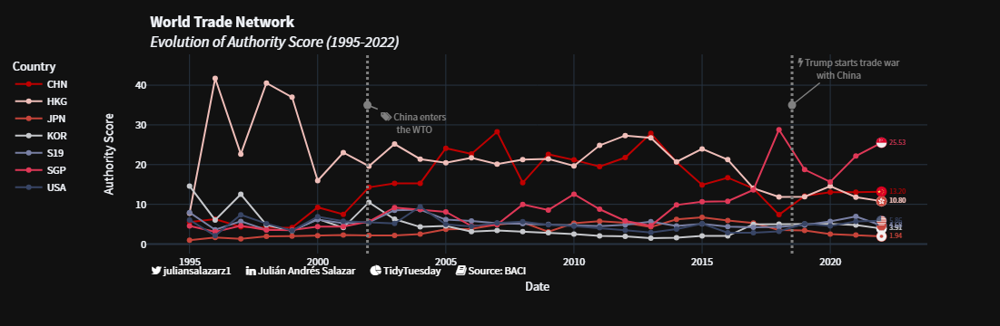

In [9]:
# Define the color map matching the flag colors
color_map = {
    'CHN': '#BF0000',     
    'HKG': '#EFBEB9',     
    'JPN': '#C7443A',     
    'KOR': '#C6C8CC',     
    'SGP': '#DF3857',     
    'USA': '#384565',
    'S19': '#7980A5',
}

# Create the line plot with the color map
fig = px.line(df_node_attributes_subset,
              x="Year",
              y="authority_score",
              color="country",
              template="plotly_dark",
              color_discrete_map=color_map,
              hover_name="name",
              custom_data=[
                  "authority_rank", "hub_rank", "authority_score", "hub_score",
                  "degree_centralities", "betweenness_centrality", "eigenvector_centrality",
                  "PageRank", "number_partners", "total_connections", "import_adjacencies", 
                  "export_adjacencies", "import_values", "export_values", "import_share"
              ]
)

fig.update_layout(
    title="<b>World Trade Network</b><br><i>Evolution of Authority Score (1995-2022)</i>",
    title_x=0.15,
    legend_title="Country",
    title_font=dict(family="Source Sans Pro, FontAwesome"),
    xaxis_title="Date",
    yaxis_title="Authority Score",
    font=dict(family="Source Sans Pro, FontAwesome"),
        legend=dict(
        orientation="v",
        yanchor="top",
        y=1,
        xanchor="left",
        x=-0.175
    ),
    hovermode="x"
)

# Update traces to customize the hover text
fig.update_traces(
    hovertemplate=(
        '[<b>%{hovertext}</b> '
        '\uf073 <b>%{x}</b>]<br>'
        '\uf0ac <b>Score:</b> %{customdata[2]:.2f} ' 
        '\uf091 <b>Ranking:</b> %{customdata[0]} '
        '\uf0c0 <b>Connections:</b> %{customdata[10]} '
        '\uf0d6 <b>USD Value:</b> $%{customdata[12]} '
        '\uf200 <b>Share:</b> %{customdata[14]:.2f}%'
        ),
    hoverlabel=dict(font=dict(family="Source Sans Pro, FontAwesome")),
    mode='lines+markers'
)

# Add annotations
fig.add_annotation(
    x=2001.9425,  # Use numeric values for x
    y=35,
    text=" \uf02c China enters <br> the WTO",
    showarrow=True,
    arrowhead=6,
    ax=50,  
    ay=20,  
    font=dict(size=11, color="gray", family="Source Sans Pro, FontAwesome"),
    align="center",
    arrowcolor="gray",
    arrowsize=1.5,
    arrowwidth=1.5
)

fig.add_annotation(
    x=2018.5096,  # Use numeric values for x
    y=35,
    text="            \uf0e7 Trump starts trade war <br> with China",
    showarrow=True,
    arrowhead=6,
    ax=50,  
    ay=-40, 
    font=dict(size=11, color="gray", family="Source Sans Pro, FontAwesome"),
    align="center",
    arrowcolor="gray",
    arrowsize=1.5,
    arrowwidth=1.5
)

# Update layout with vertical lines
fig.update_layout(shapes=[
    dict(
        type='line',
        yref='paper', y0=0, y1=1,
        xref='x', x0=2001.9425, x1=2001.9425,
        line=dict(color="gray", width=3, dash="dot")
    ),
    dict(
        type='line',
        yref='paper', y0=0, y1=1,
        xref='x', x0=2018.5096, x1=2018.5096,
        line=dict(color="gray", width=3, dash="dot")
    )
])


# Add text markers for the last points in the series
for i, d in enumerate(fig.data):
    # Convert y-values to strings with two decimal places
    y_text = [f'{y_val:.2f}' for y_val in d.y]
    
    fig.add_scatter(
        x=[d.x[-1]], 
        y=[d.y[-1]],
        mode='markers+text',
        text=[y_text[-1]],  # Use the formatted text
        textfont=dict(color=d.line.color, size=8),
        textposition='middle right',
        marker=dict(color=d.line.color, size=12),
        legendgroup=d.name,
        showlegend=False,
        hoverinfo='skip'
    )

# Add flags at the end of each time series for the year 2022
for i, row in df_node_attributes_subset.iterrows():
    if row["Year"] == 2022:  # Check if the year is 2022
        country_iso = row["country_iso2"]
        fig.add_layout_image(
            dict(
                source=f"https://raw.githubusercontent.com/matahombres/CSS-Country-Flags-Rounded/master/flags/{country_iso}.png",
                xref="x",
                yref="y",
                xanchor="center",
                yanchor="middle",
                x=row["Year"],
                y=row["authority_score"],
                sizex=2.5,
                sizey=2.5,
                sizing="contain",
                opacity=1,
                layer="above"
            )
        )

fig.add_annotation(
    x=0,
    y=-0.125,
    xref='paper',
    yref='paper',
    text=' &#xf099; juliansalazarz1       &#xf0e1; Julián Andrés Salazar       &#xf200; TidyTuesday       \uf02d Source:<a href="http://www.cepii.fr/CEPII/en/bdd_modele/bdd_modele_item.asp?id=37"> BACI</a>',
    showarrow=False,
    font=dict(color="white") 
)

fig.show()


In [10]:
fig.write_html("authority_score_evolution.html")

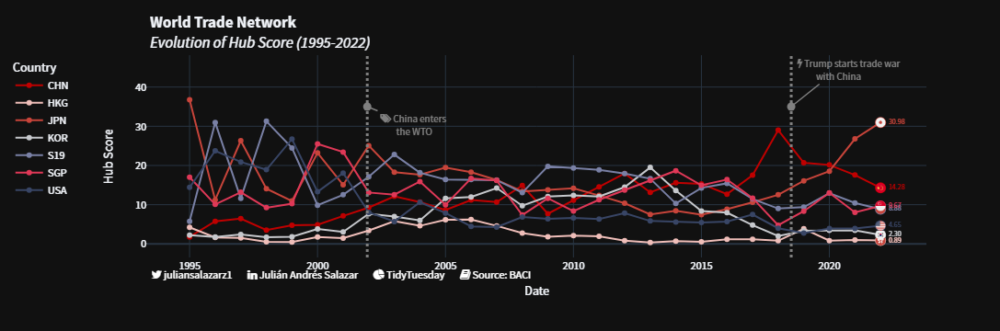

In [11]:
# Define the color map matching the flag colors
color_map = {
    'CHN': '#BF0000',     
    'HKG': '#EFBEB9',     
    'JPN': '#C7443A',     
    'KOR': '#C6C8CC',     
    'SGP': '#DF3857',     
    'USA': '#384565',
    'S19': '#7980A5',
}

# Create the line plot with the color map
fig = px.line(df_node_attributes_subset,
              x="Year",
              y="hub_score",
              color="country",
              template="plotly_dark",
              color_discrete_map=color_map,
              hover_name="name",
              custom_data=[
                  "authority_rank", "hub_rank", "authority_score", "hub_score",
                  "degree_centralities", "betweenness_centrality", "eigenvector_centrality",
                  "PageRank", "number_partners", "total_connections", "import_adjacencies", 
                  "export_adjacencies", "import_values", "export_values", "export_share"
              ]
)

fig.update_layout(
    title="<b>World Trade Network</b><br><i>Evolution of Hub Score (1995-2022)</i>",
    title_x=0.15,
    legend_title="Country",
    title_font=dict(family="Source Sans Pro, FontAwesome"),
    xaxis_title="Date",
    yaxis_title="Hub Score",
    font=dict(family="Source Sans Pro, FontAwesome"),
        legend=dict(
        orientation="v",
        yanchor="top",
        y=1,
        xanchor="left",
        x=-0.175  # Adjust this value to position the legend as desired
    ),
    hovermode="x"
)

fig.add_annotation(
    x=2001.9425,  # Use numeric values for x
    y=35,
    text=" \uf02c China enters <br> the WTO",
    showarrow=True,
    arrowhead=6,
    ax=50,  
    ay=20,  
    font=dict(size=11, color="gray", family="Source Sans Pro, FontAwesome"),
    align="center",
    arrowcolor="gray",
    arrowsize=1.5,
    arrowwidth=1.5
)

fig.add_annotation(
    x=2018.5096,  # Use numeric values for x
    y=35,
    text="            \uf0e7 Trump starts trade war <br> with China",
    showarrow=True,
    arrowhead=6,
    ax=50,  
    ay=-40, 
    font=dict(size=11, color="gray", family="Source Sans Pro, FontAwesome"),
    align="center",
    arrowcolor="gray",
    arrowsize=1.5,
    arrowwidth=1.5
)

# Update layout with vertical lines
fig.update_layout(shapes=[
    dict(
        type='line',
        yref='paper', y0=0, y1=1,
        xref='x', x0=2001.9425, x1=2001.9425,
        line=dict(color="gray", width=3, dash="dot")
    ),
    dict(
        type='line',
        yref='paper', y0=0, y1=1,
        xref='x', x0=2018.5096, x1=2018.5096,
        line=dict(color="gray", width=3, dash="dot")
    )
])


# Update traces to customize the hover text
fig.update_traces(
    hovertemplate=(
        '[<b>%{hovertext}</b> '
        '\uf073 <b>%{x}</b>]<br>'
        '\uf0ac <b>Score:</b> %{customdata[3]:.2f} ' 
        '\uf091 <b>Ranking:</b> %{customdata[1]} '
        '\uf0c0 <b>Connections:</b> %{customdata[9]} '
        '\uf0d6 <b>USD Value:</b> $%{customdata[13]} '
        '\uf200 <b>Share:</b> %{customdata[14]:.2f}%'
        ),
    hoverlabel=dict(font=dict(family="Source Sans Pro, FontAwesome")),
    mode='lines+markers'
)

# Add text markers for the last points in the series
for i, d in enumerate(fig.data):
    # Convert y-values to strings with two decimal places
    y_text = [f'{y_val:.2f}' for y_val in d.y]
    
    fig.add_scatter(
        x=[d.x[-1]], 
        y=[d.y[-1]],
        mode='markers+text',
        text=[y_text[-1]],  # Use the formatted text
        textfont=dict(color=d.line.color, size=8),
        textposition='middle right',
        marker=dict(color=d.line.color, size=12),
        legendgroup=d.name,
        showlegend=False,
        hoverinfo='skip'
    )



# Add flags at the end of each time series for the year 2022
for i, row in df_node_attributes_subset.iterrows():
    if row["Year"] == 2022:  # Check if the year is 2022
        country_iso = row["country_iso2"]
        fig.add_layout_image(
            dict(
                source=f"https://raw.githubusercontent.com/matahombres/CSS-Country-Flags-Rounded/master/flags/{country_iso}.png",
                xref="x",
                yref="y",
                xanchor="center",
                yanchor="middle",
                x=row["Year"],
                y=row["hub_score"],
                sizex=2.5,
                sizey=2.5,
                sizing="contain",
                opacity=1,
                layer="above"
            )
        )

fig.add_annotation(
    x=0,
    y=-0.125,
    xref='paper',
    yref='paper',
    text=' &#xf099; juliansalazarz1       &#xf0e1; Julián Andrés Salazar       &#xf200; TidyTuesday       \uf02d Source:<a href="http://www.cepii.fr/CEPII/en/bdd_modele/bdd_modele_item.asp?id=37"> BACI</a>',
    showarrow=False,
    font=dict(color="white") 
)


fig.show()

In [12]:
fig.write_html("hub_score_evolution.html")

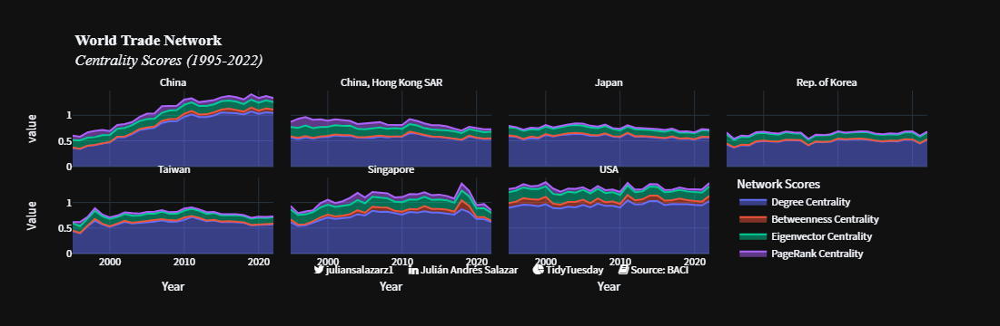

In [13]:
# Create the facet wrap plot
fig = px.area(
    df_node_attributes_subset, 
    x="Year", 
    y=["degree_centralities", "betweenness_centrality", "eigenvector_centrality", "PageRank"], 
    facet_col="name", 
    facet_col_wrap=4,  # Adjust the number of columns to fit your layout
    title="World Trade Network",
    template="plotly_dark",
    hover_name="name")

fig.update_layout(
    title="<b>World Trade Network</b><br><i>Centrality Scores (1995-2022)</i>",
    title_x=0.075,
    yaxis_title="Value",
    legend_title="Network Scores",
    title_font=dict(family="Merriweather, FontAwesome"),
    font=dict(family="Source Sans Pro, FontAwesome"),
        legend=dict(
        orientation="v",
        yanchor="top",
        xanchor="left",
        x=0.775,
        y=0.5 # Adjust this value to position the legend as desired
    ),
    hovermode="x unified"
)

# Update facet titles
for annotation in fig['layout']['annotations']:
    annotation['text'] = annotation['text'].replace('name=', '').strip()

fig.update_traces(
    hovertemplate=(
        '[<b>%{hovertext}</b>]<br>'
        '\uf0ac <b>Score:</b> %{y:.2f}  ' 
        ),
    hoverlabel=dict(font=dict(family="Source Sans Pro, FontAwesome")),
)

# Update the legend names
new_names = {
    'degree_centralities': 'Degree Centrality',
    'betweenness_centrality': 'Betweenness Centrality',
    'eigenvector_centrality': 'Eigenvector Centrality',
    'PageRank': 'PageRank Centrality'
}

for trace in fig.data:
    if trace.name in new_names:
        trace.name = new_names[trace.name]

fig.add_annotation(
    x=0.5,
    y=-0.15,
    xref='paper',
    yref='paper',
    text=' &#xf099; juliansalazarz1       &#xf0e1; Julián Andrés Salazar       &#xf200; TidyTuesday       \uf02d Source:<a href="http://www.cepii.fr/CEPII/en/bdd_modele/bdd_modele_item.asp?id=37"> BACI</a>',
    showarrow=False,
    font=dict(color="white") 
)

# Show the plot
fig.show()

In [14]:
fig.write_html("centrality_score_evolution.html")

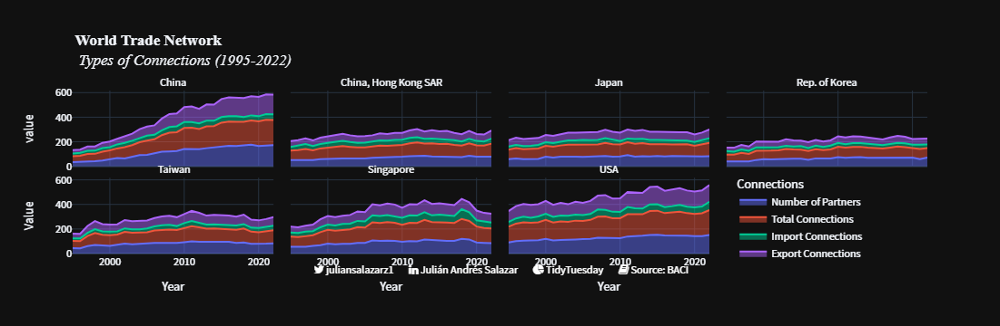

In [15]:
# Create the facet wrap plot
fig = px.area(
    df_node_attributes_subset, 
    x="Year", 
    y=["number_partners", "total_connections", "import_adjacencies", 
                  "export_adjacencies"
              ], 
    facet_col="name", 
    facet_col_wrap=4,  # Adjust the number of columns to fit your layout
    title="World Trade Network",
    template="plotly_dark",
    hover_name="name")

fig.update_layout(
    title="<b>World Trade Network</b><br><i> Types of Connections (1995-2022)</i>",
    title_x=0.075,
    yaxis_title="Value",
    legend_title="Connections",
    title_font=dict(family="Merriweather, FontAwesome"),
    font=dict(family="Source Sans Pro, FontAwesome"),
        legend=dict(
        orientation="v",
        yanchor="top",
        xanchor="left",
        x=0.775,
        y=0.5 # Adjust this value to position the legend as desired
    ),
    hovermode="x unified"
)

# Update facet titles
for annotation in fig['layout']['annotations']:
    annotation['text'] = annotation['text'].replace('name=', '').strip()

fig.update_traces(
    hovertemplate=(
        '[<b>%{hovertext}</b>]<br>'
        '\uf0c0 %{y}  ' 
        ),
    hoverlabel=dict(font=dict(family="Source Sans Pro, FontAwesome")),
)

# Update the legend names
new_names = {
    "number_partners": "Number of Partners",
    "total_connections": "Total Connections",
    "import_adjacencies": "Import Connections",
    "export_adjacencies": "Export Connections"
}

for trace in fig.data:
    if trace.name in new_names:
        trace.name = new_names[trace.name]

fig.add_annotation(
    x=0.5,
    y=-0.15,
    xref='paper',
    yref='paper',
    text=' &#xf099; juliansalazarz1       &#xf0e1; Julián Andrés Salazar       &#xf200; TidyTuesday       \uf02d Source:<a href="http://www.cepii.fr/CEPII/en/bdd_modele/bdd_modele_item.asp?id=37"> BACI</a>',
    showarrow=False,
    font=dict(color="white") 
)

# Show the plot
fig.show()

In [16]:
fig.write_html("types_off_connections_evolution.html")

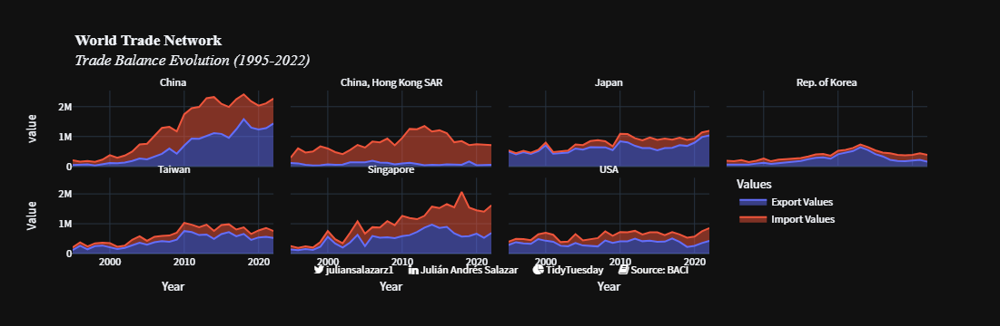

In [17]:
# Create the facet wrap plot
fig = px.area(
    df_node_attributes_subset, 
    x="Year", 
    y=["export_values","import_values"], 
    facet_col="name", 
    facet_col_wrap=4,  # Adjust the number of columns to fit your layout
    title="World Trade Network",
    template="plotly_dark",
    hover_name="name")

fig.update_layout(
    title="<b>World Trade Network</b><br><i>Trade Balance Evolution (1995-2022)</i>",
    title_x=0.075,
    yaxis_title="Value",
    legend_title="Values",
    title_font=dict(family="Merriweather, FontAwesome"),
    font=dict(family="Source Sans Pro, FontAwesome"),
        legend=dict(
        orientation="v",
        yanchor="top",
        xanchor="left",
        x=0.775,
        y=0.5 # Adjust this value to position the legend as desired
    ),
    hovermode="x unified"
)

# Update facet titles
for annotation in fig['layout']['annotations']:
    annotation['text'] = annotation['text'].replace('name=', '').strip()

fig.update_traces(
    hovertemplate=(
        '[<b>%{hovertext}</b>]<br>'
        '<b>USD \uf0d6</b> %{y}  ' 
        ),
    hoverlabel=dict(font=dict(family="Source Sans Pro, FontAwesome")),
)

# Update the legend names
new_names = {
    "export_values": "Export Values",
    "import_values": "Import Values",   
}

for trace in fig.data:
    if trace.name in new_names:
        trace.name = new_names[trace.name]

fig.add_annotation(
    x=0.5,
    y=-0.15,
    xref='paper',
    yref='paper',
    text=' &#xf099; juliansalazarz1       &#xf0e1; Julián Andrés Salazar       &#xf200; TidyTuesday       \uf02d Source:<a href="http://www.cepii.fr/CEPII/en/bdd_modele/bdd_modele_item.asp?id=37"> BACI</a>',
    showarrow=False,
    font=dict(color="white") 
)

# Show the plot
fig.show()

In [18]:
fig.write_html("trade_balace_evolution.html")

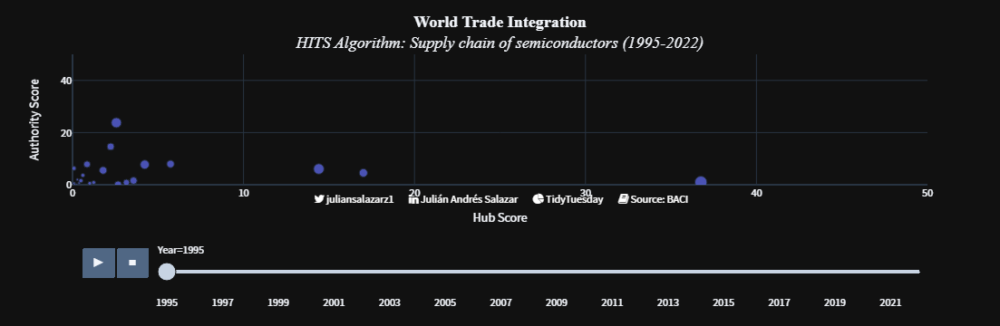

In [19]:
# Create the scatter plot with animations
fig = px.scatter(
    df_node_attributes,
    x="hub_score",
    y="authority_score",
    animation_frame="Year",
    animation_group="country",
    size="Exports+Imports",
    hover_name="name",
    range_x=[0, 50],
    range_y=[0, 50],
    custom_data=[
        "authority_rank", "hub_rank", "authority_score", "hub_score",
        "degree_centralities", "betweenness_centrality", "eigenvector_centrality",
        "PageRank", "number_partners", "total_connections", "import_adjacencies",
        "export_adjacencies", "import_values", "export_values"
    ]
)

# Update layout with custom title and styling
fig.update_layout(
    title="<b>World Trade Integration</b><br><i>HITS Algorithm: Supply chain of semiconductors (1995-2022)</i>",
    title_x=0.5,
    title_font_family="Merriweather",
    font_family="Source Sans Pro, FontAwesome",
    title_font_size=18,
    template="plotly_dark",
    xaxis_title="Hub Score",
    yaxis_title="Authority Score"
)

# Define the hover template
hover_template = (
    '<b>%{hovertext}</b><br>'
    '&#x2022; <b>HITS Ranking:</b><br>'
    '  - As an importer: %{customdata[0]}<br>'
    '  - As an exporter: %{customdata[1]}<br>'
    '&#x2022; <b>HITS Score:</b><br>'
    '  - As an importer: %{customdata[2]:.4f}<br>'
    '  - As an exporter: %{customdata[3]:.4f}<br>'
    '&#x2022; <b>Centrality Indicators:</b><br>'
    '  - Centrality Degree: %{customdata[4]:.4f}<br>'
    '  - Betweenness Degree: %{customdata[5]:.4f}<br>'
    '  - Eigenvector Centrality: %{customdata[6]:.4f}<br>'
    '  - PageRank Score: %{customdata[7]:.4f}<br>'
    '&#x2022; <b>Connection Indicators:</b><br>'
    '  - # of partners: %{customdata[8]}<br>'
    '  - # of connections: %{customdata[9]}<br>'
    '  - # of import connections: %{customdata[10]}<br>'
    '  - # of export connections: %{customdata[11]}<br>'
    '&#x2022; <b>Trade Balance (USD Thousands):</b><br>'
    '  - Sum of Imports: $%{customdata[12]:,.2f}<br>'
    '  - Sum of Exports: $%{customdata[13]:,.2f}'
)

# Update the hover template for the initial traces
fig.update_traces(
    hovertemplate=hover_template,
    #marker_color="rgba(0,0,0,0)"

)

# Apply the hover template update to each frame
for frame in fig.frames:
    for data in frame.data:
        data.update(
            hovertemplate=hover_template,
            #marker_color="rgba(0,0,0,0)"
        )

fig.add_annotation(
    x=0.5,
    y=-0.175,
    xref='paper',
    yref='paper',
    text=' &#xf099; juliansalazarz1       &#xf0e1; Julián Andrés Salazar       &#xf200; TidyTuesday       \uf02d Source:<a href="http://www.cepii.fr/CEPII/en/bdd_modele/bdd_modele_item.asp?id=37"> BACI</a>',
    showarrow=False,
    font=dict(color="white") 
)

# Show the figure
fig.show()

In [20]:
fig.write_html("authority_hub_scatterplotevolution.html")

In [25]:
# Precompute image sizes
minDim = df_node_attributes[["hub_score", "authority_score"]].max().idxmax()
maxi = df_node_attributes[minDim].max()
df_node_attributes["image_size"] = np.sqrt(
    df_node_attributes["Exports+Imports"] / df_node_attributes["Exports+Imports"].max()
) * maxi * 0.15 + maxi * 0.03

# Create the scatter plot with animations
fig = px.scatter(
    df_node_attributes,
    x="hub_score",
    y="authority_score",
    animation_frame="Year",
    animation_group="country",
    size="Exports+Imports",
    hover_name="name",
    range_x=[0, 50],
    range_y=[0, 50],
    custom_data=[
        "authority_rank", "hub_rank", "authority_score", "hub_score",
        "degree_centralities", "betweenness_centrality", "eigenvector_centrality",
        "PageRank", "number_partners", "total_connections", "import_adjacencies",
        "export_adjacencies", "import_values", "export_values"
    ]
)

# Update layout with custom title and styling
fig.update_layout(
    title="<b>World Trade Integration</b><br><i>HITS Algorithm: Supply chain of semiconductors (1995-2022)</i>",
    title_x=0.5,
    title_font_family="Merriweather",
    font_family="Source Sans Pro, FontAwesome",
    title_font_size=18,
    template="plotly_dark",
    xaxis_title="Hub Score",
    yaxis_title="Authority Score"
)

# Define the hover template
hover_template = (
    '<b>%{hovertext}</b><br>'
    '&#x2022; <b>HITS Ranking:</b><br>'
    '  - As an importer: %{customdata[0]}<br>'
    '  - As an exporter: %{customdata[1]}<br>'
    '&#x2022; <b>HITS Score:</b><br>'
    '  - As an importer: %{customdata[2]:.4f}<br>'
    '  - As an exporter: %{customdata[3]:.4f}<br>'
    '&#x2022; <b>Centrality Indicators:</b><br>'
    '  - Centrality Degree: %{customdata[4]:.4f}<br>'
    '  - Betweenness Degree: %{customdata[5]:.4f}<br>'
    '  - Eigenvector Centrality: %{customdata[6]:.4f}<br>'
    '  - PageRank Score: %{customdata[7]:.4f}<br>'
    '&#x2022; <b>Connection Indicators:</b><br>'
    '  - # of partners: %{customdata[8]}<br>'
    '  - # of connections: %{customdata[9]}<br>'
    '  - # of import connections: %{customdata[10]}<br>'
    '  - # of export connections: %{customdata[11]}<br>'
    '&#x2022; <b>Trade Balance (USD Thousands):</b><br>'
    '  - Sum of Imports: $%{customdata[12]:,.2f}<br>'
    '  - Sum of Exports: $%{customdata[13]:,.2f}'
)

# Update the hover template for the initial traces
fig.update_traces(
    hovertemplate=hover_template,
    marker_color="rgba(0,0,0,0)"
)

# Apply the hover template update to each frame
for frame in fig.frames:
    for data in frame.data:
        data.update(
            hovertemplate=hover_template,
            marker_color="rgba(0,0,0,0)"
        )

# Precompute image sizes
df_node_attributes["image_size"] = np.sqrt(
    df_node_attributes["Exports+Imports"] / df_node_attributes["Exports+Imports"].max()
) * maxi * 0.15 + maxi * 0.03

# Add flag images to each frame
minDim = df_node_attributes[["hub_score", "authority_score"]].max().idxmax()
maxi = df_node_attributes[minDim].max()
for frame in fig.frames:
    year = frame.name
    df_year = df_node_attributes[df_node_attributes["Year"] == int(year)]
    frame.layout.images = [
        dict(
            source=f"https://raw.githubusercontent.com/matahombres/CSS-Country-Flags-Rounded/master/flags/{row['country_iso2']}.png",
            xref="x",
            yref="y",
            xanchor="center",
            yanchor="middle",
            x=row["hub_score"],
            y=row["authority_score"],
            sizex=row["image_size"],
            sizey=row["image_size"],
            sizing="contain",
            opacity=0.8,
            layer="above"
        ) 
    ]

fig.add_annotation(
    x=0.5,
    y=-0.175,
    xref='paper',
    yref='paper',
    text=' &#xf099; juliansalazarz1       &#xf0e1; Julián Andrés Salazar       &#xf200; TidyTuesday       \uf02d Source:<a href="http://www.cepii.fr/CEPII/en/bdd_modele/bdd_modele_item.asp?id=37"> BACI</a>',
    showarrow=False,
    font=dict(color="white") 
)

# Show the figure
fig.show()


KeyError: 'image_size'

In [46]:
fig.write_html("authority_hub_scatterplotevolutionflags2.html")

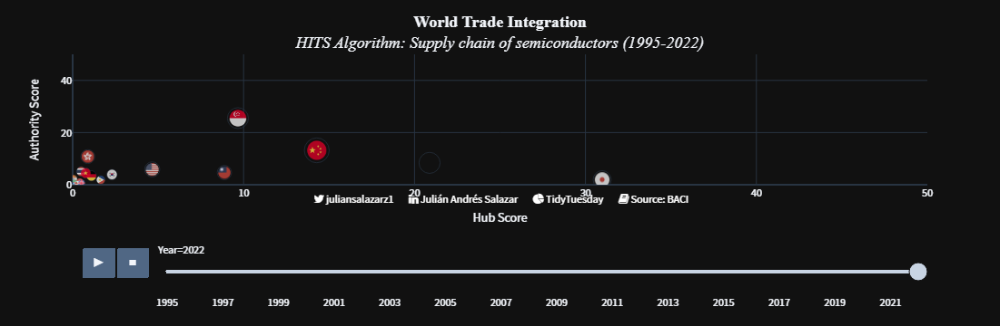

In [28]:


# Precompute image sizes
minDim = df_node_attributes[["hub_score", "authority_score"]].max().idxmax()
maxi = df_node_attributes[minDim].max()
df_node_attributes["image_size"] = np.sqrt(
    df_node_attributes["Exports+Imports"] / df_node_attributes["Exports+Imports"].max()
) * maxi * 0.15 + maxi * 0.03

# Create the scatter plot with animations
fig = px.scatter(
    df_node_attributes,
    x="hub_score",
    y="authority_score",
    animation_frame="Year",
    animation_group="country",
    size="Exports+Imports",
    hover_name="name",
    range_x=[0, 50],
    range_y=[0, 50],
    custom_data=[
        "authority_rank", "hub_rank", "authority_score", "hub_score",
        "degree_centralities", "betweenness_centrality", "eigenvector_centrality",
        "PageRank", "number_partners", "total_connections", "import_adjacencies",
        "export_adjacencies", "import_values", "export_values"
    ]
)

# Update layout with custom title and styling
fig.update_layout(
    title="<b>World Trade Integration</b><br><i>HITS Algorithm: Supply chain of semiconductors (1995-2022)</i>",
    title_x=0.5,
    title_font_family="Merriweather",
    font_family="Source Sans Pro, FontAwesome",
    title_font_size=18,
    template="plotly_dark",
    xaxis_title="Hub Score",
    yaxis_title="Authority Score"
)

# Define the hover template
hover_template = (
    '<b>%{hovertext}</b><br>'
    '&#x2022; <b>HITS Ranking:</b><br>'
    '  - As an importer: %{customdata[0]}<br>'
    '  - As an exporter: %{customdata[1]}<br>'
    '&#x2022; <b>HITS Score:</b><br>'
    '  - As an importer: %{customdata[2]:.4f}<br>'
    '  - As an exporter: %{customdata[3]:.4f}<br>'
    '&#x2022; <b>Centrality Indicators:</b><br>'
    '  - Centrality Degree: %{customdata[4]:.4f}<br>'
    '  - Betweenness Degree: %{customdata[5]:.4f}<br>'
    '  - Eigenvector Centrality: %{customdata[6]:.4f}<br>'
    '  - PageRank Score: %{customdata[7]:.4f}<br>'
    '&#x2022; <b>Connection Indicators:</b><br>'
    '  - # of partners: %{customdata[8]}<br>'
    '  - # of connections: %{customdata[9]}<br>'
    '  - # of import connections: %{customdata[10]}<br>'
    '  - # of export connections: %{customdata[11]}<br>'
    '&#x2022; <b>Trade Balance (USD Thousands):</b><br>'
    '  - Sum of Imports: $%{customdata[12]:,.2f}<br>'
    '  - Sum of Exports: $%{customdata[13]:,.2f}'
)

# Update the hover template for the initial traces
fig.update_traces(
    hovertemplate=hover_template,
    marker_color="rgba(0,0,0,0)"
)

# Apply the hover template update to each frame
for frame in fig.frames:
    for data in frame.data:
        data.update(
            hovertemplate=hover_template,
            marker_color="rgba(0,0,0,0)"
        )

# Add flag images to each frame
for frame in fig.frames:
    year = frame.name
    df_year = df_node_attributes[df_node_attributes["Year"] == int(year)]
    images = [
        dict(
            source=f"https://raw.githubusercontent.com/matahombres/CSS-Country-Flags-Rounded/master/flags/{row['country_iso2']}.png",
            xref="x",
            yref="y",
            xanchor="center",
            yanchor="middle",
            x=row["hub_score"],
            y=row["authority_score"],
            sizex=row["image_size"],
            sizey=row["image_size"],
            sizing="contain",
            opacity=0.8,
            layer="above"
        ) for i, row in df_year.iterrows()
    ]
    frame.layout.update(images=images)

fig.add_annotation(
    x=0.5,
    y=-0.175,
    xref='paper',
    yref='paper',
    text=' &#xf099; juliansalazarz1       &#xf0e1; Julián Andrés Salazar       &#xf200; TidyTuesday       \uf02d Source:<a href="http://www.cepii.fr/CEPII/en/bdd_modele/bdd_modele_item.asp?id=37"> BACI</a>',
    showarrow=False,
    font=dict(color="white") 
)

# Show the figure
fig.show()
